In [31]:
#import required libraries
import networkx as nx
import matplotlib.pyplot as plt 
import pandas as pd
import numpy as np
import community  as com

In [32]:
# Set multiple outputs of a cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [33]:
#read the dataset
df = pd.read_csv(r'/Users/nithyashree/Desktop/musae_chameleon_edges.csv')

In [34]:
# Check the first few rows of the df
print(df.head())

# Check if the chameleon network is directed or undirected
e = df[['id1', 'id2']]
check_directed = any(e.duplicated() | e[['id1', 'id2']].duplicated())

#condition clause to print the network
if check_directed:
    print("The chameleon network is directed.")
else:
    print("The chameleon network is undirected.")

    id1   id2
0  2034  1939
1  2034  2263
2  2034  1976
3  2034  2234
4  2034   804
The chameleon network is undirected.


In [35]:
#preprocessing the dataset 
#performing random sampling by selecting 5 % of rows from original dataset
random_dfsampling = df.sample(frac=0.05, random_state=42)

# Get the number of nodes and edges after sampling process
number_of_nsampled = pd.concat([random_dfsampling['id1'], random_dfsampling['id2']]).nunique()
number_of_esampled = len(random_dfsampling)

#display the results
print(f"Number of nodes in random sampled dataset: {number_of_nsampled}")
print(f"Number of edges in random sampled dataset: {number_of_esampled}")


Number of nodes in random sampled dataset: 1198
Number of edges in random sampled dataset: 1805


<Figure size 2500x1500 with 0 Axes>

Text(0.5, 1.0, 'Original graph of chameleon dataset')

(-1.2099999961369665,
 1.2099999996329245,
 -1.2099958192797429,
 1.2099958103822221)

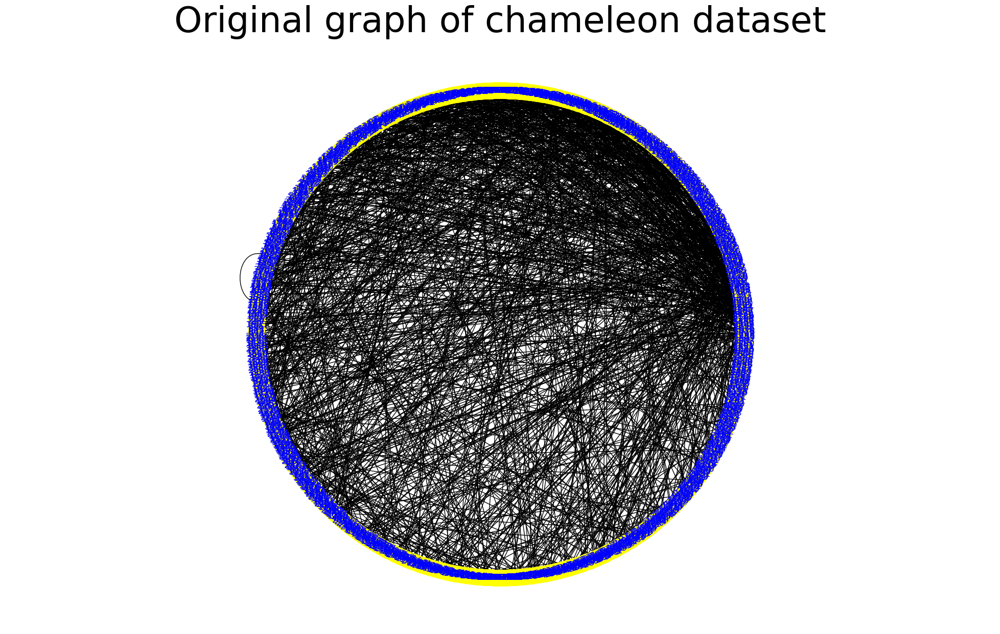

<Figure size 2500x1500 with 0 Axes>

Text(0.5, 1.0, 'Random Graph of chameleon dataset')

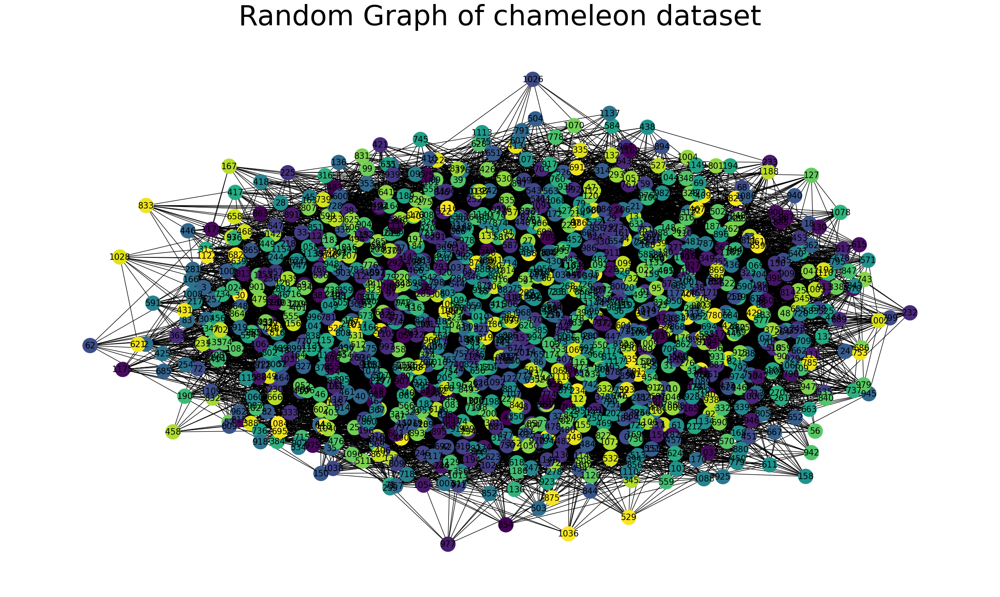

<Figure size 2500x1500 with 0 Axes>

Text(0.5, 1.0, 'Watts-Strogatz Graph of chameleon dataset')

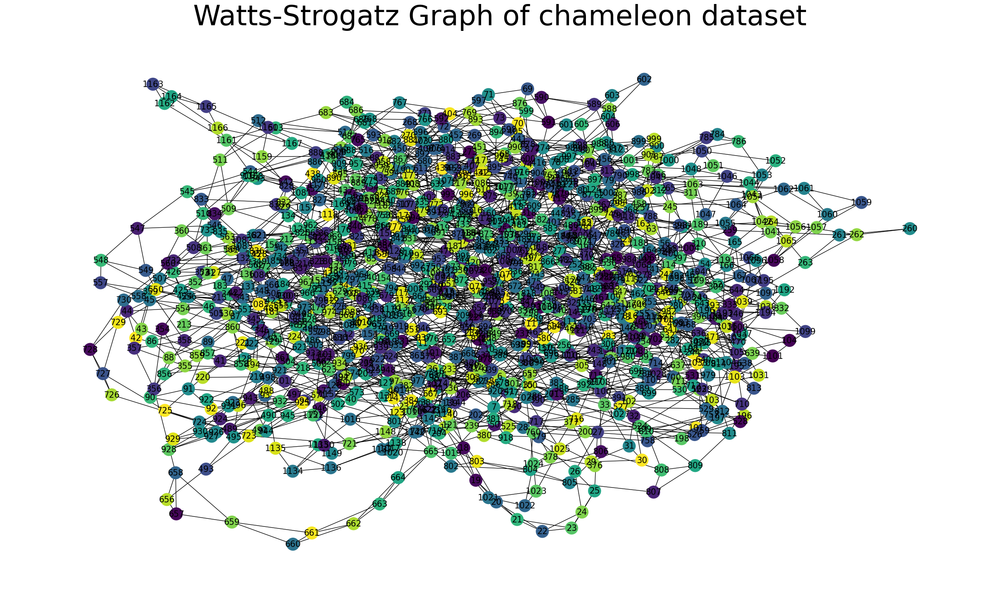

In [36]:

#line is to convert the edge information from the df into a graph 
#id1 and id2 are column names in dataset
Graph_net = nx.from_pandas_edgelist(random_dfsampling, 'id1', 'id2')

#to execute this code i took reference from lab 8 and 9
# Generating both a random graph and a Watts-Strogatz graph to understand how the graph is structured in different ways


# Number of edges for 2% connectivity in the graph
n = len(Graph_net.nodes)
numberof_e_random = 0.02 * n * (n - 1) // 2  

# Used Erdős-Rényi model for visualizing the graph in a better way
# Create random graph using gnm_random_graph
#set seed to genreate graph with same structure every time
renyi_randomgraph = nx.gnm_random_graph(n, numberof_e_random, seed=1347)


#to execute this code i took reference from lab 9
# Create Watts-Strogatz Graph
n = len(Graph_net.nodes)
# Each node is connected to k nearest neighbors
k = 4  
# Probability of rewiring each edge
p = 0.2  
#generate the graph
watts_graphnet = nx.watts_strogatz_graph(n, k, p)

# Choose a spring layout for better visualization
layout = nx.spring_layout(watts_graphnet)

# Generate a circular layout for the orignal graph
layout_circ = nx.circular_layout(Graph_net)

# Generate random colors for nodes
random_ncolours = np.random.rand(len(renyi_randomgraph))
random_nodeclours = np.random.rand(n)


# Draw the original graph with a circular layout
plt.figure(figsize=(25, 15))
plt.title("Original graph of chameleon dataset", fontsize= 50)
#draw the graph with node size ,labels, font size and colour
nx.draw(Graph_net, pos=layout_circ, with_labels=True, node_size=500, font_size=12, font_color= "blue", node_color="yellow", edge_color='black')
plt.axis('equal')
plt.savefig("/Users/nithyashree/Desktop/agraph_chameleonh.png", dpi=100)
plt.show()

# Random Graph Visualization
plt.figure(figsize=(25, 15))
plt.title("Random Graph of chameleon dataset", fontsize= 50)
#draw the graph with node size ,labels, font size and colour
nx.draw(renyi_randomgraph, node_size=700, with_labels=True, font_size=15, node_color=random_ncolours)
#used tight layout to give spaces between graphs and avoid overlapping
plt.tight_layout()
plt.savefig("/Users/nithyashree/Desktop/aaerdos_grap_chameleonh.png", dpi=100)
plt.show()

# Watts-Strogatz Graph Visualization
plt.figure(figsize=(25, 15))
plt.title("Watts-Strogatz Graph of chameleon dataset", fontsize= 50)
#draw the graph with node size ,labels, font size and colour
nx.draw(watts_graphnet, pos=layout, with_labels=True, font_size=15, node_size=500, node_color=random_nodeclours)
#used tight layout to give spaces between graphs and avoid overlapping
plt.tight_layout()
plt.savefig("/Users/nithyashree/Desktop/aawatts_agraphnet_chameleon.png", dpi=100)
plt.show()


Mean Degree of chameleon (NetworkX): 2.991652754590985


(array([920., 117.,  57.,  43.,  26.,  15.,   3.,   8.,   4.,   0.,   1.,
          1.,   0.,   0.,   1.,   0.,   0.,   1.,   0.,   1.]),
 array([ 1. ,  3.2,  5.4,  7.6,  9.8, 12. , 14.2, 16.4, 18.6, 20.8, 23. ,
        25.2, 27.4, 29.6, 31.8, 34. , 36.2, 38.4, 40.6, 42.8, 45. ]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Degree Distribution of chameleon dataset')

Text(0.5, 0, 'Degree')

Text(0, 0.5, 'Frequency')

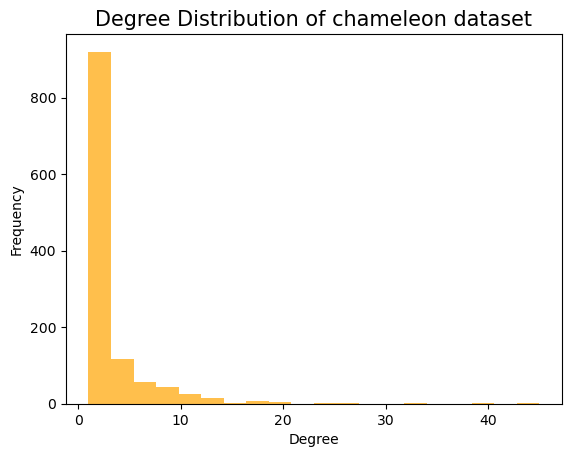

In [37]:
# Compute degrees for original graph 
graph_degrees = dict(nx.degree(Graph_net))

# Mean Degree for original Graph
mean_graph_degree_nx = sum(graph_degrees.values()) / len(graph_degrees)
# Display Mean Degree for Watts-Strogatz Graph of chameleon dataset
print("Mean Degree of chameleon (NetworkX):", mean_graph_degree_nx)

#Histogram Plot for original Graph of chameleon Degree Distribution
#hist keyword is used for plotting 
plt.hist(list(graph_degrees.values()), bins=20, color='Orange', alpha=0.7)
#title for plot
plt.title("Degree Distribution of chameleon dataset", fontsize= 15)
# label for x axis
plt.xlabel("Degree")
#label for y axis
plt.ylabel("Frequency")
plt.savefig("/Users/nithyashree/Desktop/ameanadegree.png", dpi=100)
plt.show() 

In [38]:
# Calculate density of the chamelon dataset
density_data = nx.density(Graph_net)

# Display the density
print(f"Density of chameleon dataset: {density_data:.4f}")

Density of chameleon dataset: 0.0025


In [39]:
# Calculate clustering coefficient of chameleon dataset
clusteringcoefficient_data = nx.average_clustering(Graph_net)

#display the result
print("Average Clustering Coefficient of Chameleon dataset:", clusteringcoefficient_data)


Average Clustering Coefficient of Chameleon dataset: 0.02219593097601207


In [40]:
# Calculate closeness centrality for each node 
degrees_graph = dict(nx.degree_centrality(Graph_net))

# Display the closeness centrality of each node
print("The closeness centrality of each node:")
print(degrees_graph)

# Calculate closeness centrality for each node 
closeness_graph = dict(nx.closeness_centrality(Graph_net))

# Display the closeness centrality of each node
print("The closeness centrality of each node:")
print(closeness_graph)
 # Calculate betweenss centrality for each node 
betweenness_graph=dict(nx.betweenness_centrality(Graph_net))

# Display the betweeness centrality of each node
print("The betweenness centrality of each node:")
print(betweenness_graph)

The closeness centrality of each node:
{2097: 0.003341687552213868, 1976: 0.03759398496240601, 1316: 0.000835421888053467, 813: 0.005847953216374269, 1376: 0.001670843776106934, 2275: 0.002506265664160401, 158: 0.000835421888053467, 2249: 0.015037593984962405, 2127: 0.002506265664160401, 1452: 0.000835421888053467, 244: 0.000835421888053467, 2118: 0.000835421888053467, 2168: 0.002506265664160401, 1569: 0.014202172096908938, 2186: 0.010025062656641603, 890: 0.014202172096908938, 2070: 0.001670843776106934, 373: 0.006683375104427736, 1777: 0.001670843776106934, 1241: 0.002506265664160401, 495: 0.001670843776106934, 2134: 0.00835421888053467, 1121: 0.004177109440267335, 1285: 0.012531328320802004, 1860: 0.011695906432748537, 652: 0.00835421888053467, 559: 0.000835421888053467, 1409: 0.00835421888053467, 1344: 0.005847953216374269, 2: 0.000835421888053467, 1237: 0.002506265664160401, 9: 0.000835421888053467, 1741: 0.02756892230576441, 664: 0.002506265664160401, 1714: 0.010025062656641603, 

The closeness centrality of each node:
{2097: 0.13302795638653614, 1976: 0.15322371243423874, 1316: 0.0981427511615573, 813: 0.11228028811520264, 1376: 0.11205489531941856, 2275: 0.10129362117372342, 158: 0.13433311775056547, 2249: 0.16230541312649402, 2127: 0.11055263590623929, 1452: 0.09682021375431016, 244: 0.000835421888053467, 2118: 0.000835421888053467, 2168: 0.10607623185039537, 1569: 0.10755409842723503, 2186: 0.135234346270696, 890: 0.14746342249310193, 2070: 0.09268967966388487, 373: 0.09951556528916, 1777: 0.10714122280947211, 1241: 0.11768853423427743, 495: 0.11358076413970179, 2134: 0.10453291588714415, 1121: 0.09483370387984248, 1285: 0.09554542489645224, 1860: 0.12092442960982415, 652: 0.1357148872430437, 559: 0.13433311775056547, 1409: 0.09950191993535647, 1344: 0.0920664174179846, 2: 0.08262182649306099, 1237: 0.09241817397969367, 9: 0.11725117177065031, 1741: 0.13801207723251324, 664: 0.11749797637444215, 1714: 0.12094458368142577, 1603: 0.04729324179409246, 1905: 0.0

The betweenness centrality of each node:
{2097: 0.0040157161877102925, 1976: 0.1565876217417829, 1316: 0.0, 813: 0.00874414626131107, 1376: 0.0015120627004753372, 2275: 0.0026196605563020324, 158: 0.0, 2249: 0.3175000293030958, 2127: 0.004908848792543128, 1452: 0.0, 244: 0.0, 2118: 0.0, 2168: 0.00651696520893542, 1569: 0.028186217553821797, 2186: 0.015973865774800103, 890: 0.07094912775137736, 2070: 9.409008154313443e-05, 373: 0.002581594349226903, 1777: 0.00025814519183506383, 1241: 0.002998063203303896, 495: 0.013283430882289463, 2134: 0.013405950195001808, 1121: 0.0010355733636476718, 1285: 0.010862816978664242, 1860: 0.02100842787495988, 652: 0.02835965794920958, 559: 0.0, 1409: 0.002320985021811619, 1344: 0.001988639377960928, 2: 0.0, 1237: 0.002599866444260037, 9: 0.0, 1741: 0.06879922273952528, 664: 0.0017809799341638047, 1714: 0.009017354400051523, 1603: 0.001300631735414344, 1905: 0.005191350729108166, 1408: 0.013003583344048594, 2263: 0.03397960900894509, 291: 0.0, 816: 0.002

<BarContainer object of 1198 artists>

Text(0.5, 1.0, 'Node Degree Centrality of each node')

Text(0.5, 0, 'Node')

Text(0, 0.5, 'Degree Centrality')

<BarContainer object of 1198 artists>

Text(0.5, 1.0, 'Node Closeness Centrality of each node')

Text(0.5, 0, 'Node')

Text(0, 0.5, 'Closeness Centrality')

<BarContainer object of 1198 artists>

Text(0.5, 1.0, 'Node Betweenness Centrality of each node')

Text(0.5, 0, 'Node')

Text(0, 0.5, 'Betweenness Centrality')

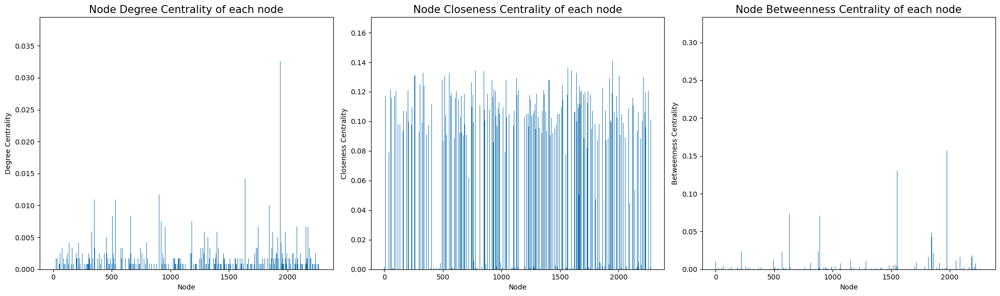

Values Degree, Closeness, and Betweenness Centralities:
        degree  closeness  betweenness
2097  0.003342   0.133028     0.004016
1976  0.037594   0.153224     0.156588
1316  0.000835   0.098143     0.000000
813   0.005848   0.112280     0.008744
1376  0.001671   0.112055     0.001512
...        ...        ...          ...
341   0.000835   0.106263     0.000000
1691  0.000835   0.106372     0.000000
1809  0.000835   0.077487     0.000000
1313  0.000835   0.101948     0.000000
1796  0.000835   0.080899     0.000000

[1198 rows x 3 columns]


In [41]:
# Save degree, closeness, and betweenness centralities in a dataframe
chameleon_df=pd.DataFrame.from_dict([degrees_graph, closeness_graph, betweenness_graph]).T
chameleon_df.columns = ["degree", "closeness", "betweenness"]


# Create subplots
fig, (G1, G2, G3) = plt.subplots(1, 3, figsize=(20, 6))

# Bar graph for degree centrality
G1.bar(chameleon_df.index, chameleon_df['degree'])
G1.set_title('Node Degree Centrality of each node', fontsize= 15)
G1.set_xlabel('Node')
G1.set_ylabel('Degree Centrality')

# Bar graph for closeness centrality
G2.bar(chameleon_df.index, chameleon_df['closeness'])
G2.set_title('Node Closeness Centrality of each node', fontsize= 15)
G2.set_xlabel('Node')
G2.set_ylabel('Closeness Centrality')

# Bar graph for betweenness centrality
G3.bar(chameleon_df.index, chameleon_df['betweenness'])
G3.set_title('Node Betweenness Centrality of each node', fontsize= 15)
G3.set_xlabel('Node')
G3.set_ylabel('Betweenness Centrality')

# Adjust layout
plt.tight_layout()
plt.savefig("/Users/nithyashree/Desktop/aacentrality.png", dpi=100)
# Display the plots
plt.show()



# Display the values
print("Values Degree, Closeness, and Betweenness Centralities:")
print(chameleon_df)

#save the dataframe in a csv file
chameleon_df.to_csv('/Users/nithyashree/Downloads/acentrality.csv', encoding='utf-8')

<BarContainer object of 3 artists>

Text(0.5, 1.0, 'Nodes with Maximum Centrality Measures')

Text(0, 0.5, 'Centrality Value')

Text(0, 0.08759398496240602, '0.0376\nNode: [1976]\n')

Text(1, 0.21230541312649404, '0.1623\nNode: [2249]\n')

Text(2, 0.3675000293030958, '0.3175\nNode: [2249]\n')

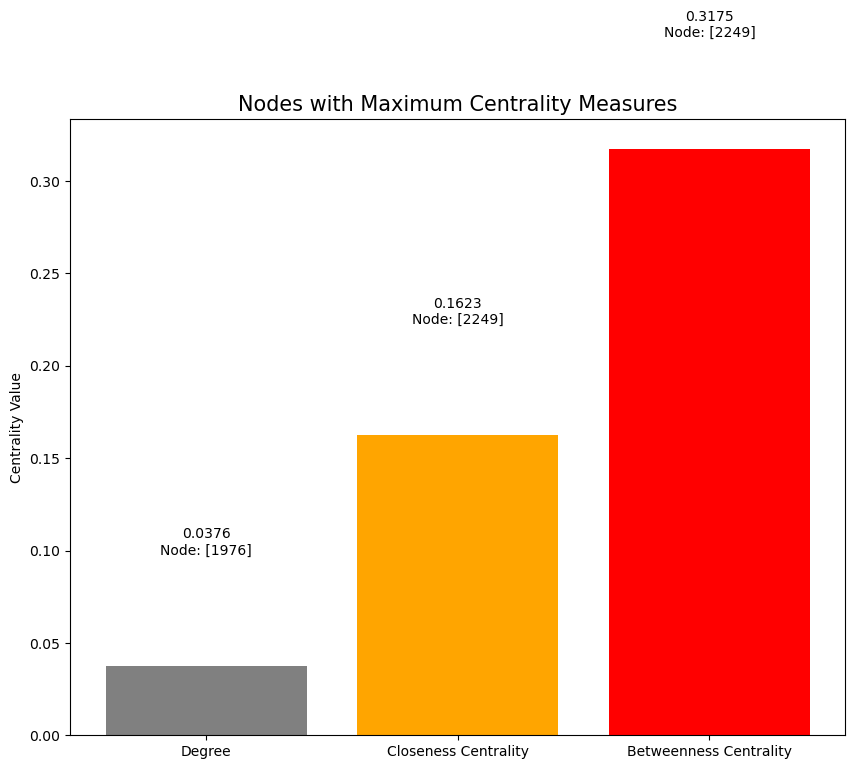

The nodes with maximum degrees is/are  [1976] . The maximum degree is 0.03759398496240601
The nodes with maximum closeness centrality is/are  [2249] . The maximum closeness centrality is 0.16230541312649402
The nodes with maximum betweenness centrality is/are  [2249] . The maximum betweenness centrality is 0.3175000293030958


In [42]:
#Compute the nodes with maximum values of the degree, closeness, and betweenness
maximum_degree=max(degrees_graph.values())
maximum_closeness=max(closeness_graph.values())
maximum_betweenness=max(betweenness_graph.values())

#create a plot with axis
fig, a1 = plt.subplots(figsize=(10, 8))

maximum_degree_key=[items for items, value in degrees_graph.items() 
                if value == max(degrees_graph.values())]
maximum_closeness_key=[items for items, value in closeness_graph.items() 
                if value == max(closeness_graph.values())]
maximum_betweenness_key=[items for items, value in betweenness_graph.items() 
                if value == max(betweenness_graph.values())]

# Plotting the values of degree, closeness, centrality
a1.bar(['Degree', 'Closeness Centrality', 'Betweenness Centrality'], 
       [maximum_degree, maximum_closeness, maximum_betweenness], color=['grey', 'orange', 'red'])
#set the titlr
a1.set_title('Nodes with Maximum Centrality Measures', fontsize= 15)
a1.set_ylabel('Centrality Value')


#label for nodes on the bar
for i, (max_value, key_list) in enumerate(zip([maximum_degree, maximum_closeness, maximum_betweenness],
                                              [maximum_degree_key, maximum_closeness_key, maximum_betweenness_key])):
    a1.text(i, max_value + 0.05, f'{max_value:.4f}\nNode: {key_list}\n', ha='center', va='bottom')



plt.savefig("/Users/nithyashree/Desktop/aamaximum.png", dpi=100)
#visualize the plot
plt.show()

#Display the maximum values
print("The nodes with maximum degrees is/are ", maximum_degree_key, 
      ". The maximum degree is", maximum_degree)
print("The nodes with maximum closeness centrality is/are ", maximum_closeness_key, 
      ". The maximum closeness centrality is", maximum_closeness)
print("The nodes with maximum betweenness centrality is/are ", maximum_betweenness_key, 
      ". The maximum betweenness centrality is", maximum_betweenness)

In [43]:
pip install python-louvain

Note: you may need to restart the kernel to use updated packages.


Number of communities found: 104
Community 0 has 96 nodes
Community 1 has 84 nodes
Community 2 has 5 nodes
Community 3 has 24 nodes
Community 4 has 6 nodes
Community 5 has 2 nodes
Community 6 has 132 nodes
Community 7 has 206 nodes
Community 8 has 81 nodes
Community 9 has 74 nodes
Community 10 has 4 nodes
Community 11 has 78 nodes
Community 12 has 38 nodes
Community 13 has 45 nodes
Community 14 has 18 nodes
Community 15 has 4 nodes
Community 16 has 7 nodes
Community 17 has 5 nodes
Community 18 has 4 nodes
Community 19 has 3 nodes
Community 20 has 3 nodes
Community 27 has 37 nodes
Community 22 has 3 nodes
Community 23 has 3 nodes
Community 24 has 6 nodes
Community 25 has 4 nodes
Community 26 has 3 nodes
Community 28 has 2 nodes
Community 29 has 2 nodes
Community 30 has 16 nodes
Community 31 has 9 nodes
Community 32 has 4 nodes
Community 33 has 2 nodes
Community 34 has 2 nodes
Community 35 has 2 nodes
Community 36 has 2 nodes
Community 37 has 2 nodes
Community 38 has 3 nodes
Community 39

<Figure size 2500x1500 with 0 Axes>

Text(0.5, 1.0, 'Connection detection of chameleon dataset')

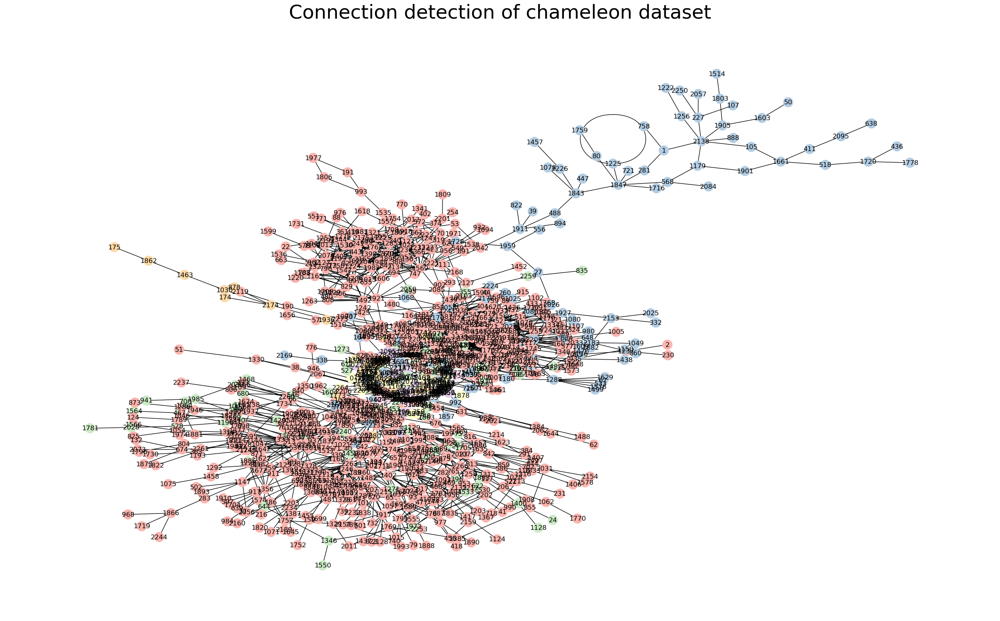

In [44]:
#https://networkx.org/documentation/stable/ 
#for plotting the kamada_kawai_layout and  Louvain algorithm for community detection

#refered this code from this website

# Apply the Louvain algorithm for community detection

partition_louvain = com.best_partition(Graph_net)

# Create a set to store community IDs
uniq_commu = set(partition_louvain.values())

# Print the number of communities found in the dataset
num_communities = len(uniq_commu)
print(f"Number of communities found: {num_communities}")

# Create a dictionary function  to store the number of nodes in each community
comm_sizes = {}
for n, cid in partition_louvain.items():
    if cid not in comm_sizes:
        comm_sizes[cid] = 1
    else:
        comm_sizes[cid] += 1

# Print the community formed and number of nodes for each community has formed
for cid, s in comm_sizes.items():
    print(f"Community {cid} has {s} nodes")

# Calculate modularity
modularity_louvain = com.modularity(partition_louvain, Graph_net)
print(f"Modularity of Community Detection: {modularity_louvain}")

#create graph a with kamada_kawai layout
layout_louvian = nx.kamada_kawai_layout(Graph_net)

# Use distinct color palettes for communities to identify the communities
clr_palette = plt.cm.Pastel1




#get community colors
clrs = [partition_louvain[node] for node in Graph_net.nodes()]

#assign the size for figure
plt.figure(figsize=(25, 15))  

# draw the graph
# Generate a graph for community detection
nx.draw(Graph_net, pos=layout_louvian, node_color=clrs, cmap=clr_palette, with_labels=True)
plt.title("Connection detection of chameleon dataset", fontsize= 35)
plt.savefig("/Users/nithyashree/Desktop/aaommunity.png", dpi=100)
plt.show()  



(array([795., 125., 117.,  26.,  62.,  12.,  26.,   6.,   9.,   1.,   8.,
          2.,   4.,   0.,   0.,   1.,   0.,   1.,   0.,   0.,   0.,   1.,
          0.,   0.,   0.,   1.,   0.,   0.,   0.,   1.]),
 array([0.00083542, 0.00206071, 0.00328599, 0.00451128, 0.00573656,
        0.00696185, 0.00818713, 0.00941242, 0.01063771, 0.01186299,
        0.01308828, 0.01431356, 0.01553885, 0.01676413, 0.01798942,
        0.0192147 , 0.02043999, 0.02166527, 0.02289056, 0.02411585,
        0.02534113, 0.02656642, 0.0277917 , 0.02901699, 0.03024227,
        0.03146756, 0.03269284, 0.03391813, 0.03514341, 0.0363687 ,
        0.03759398]),
 <BarContainer object of 30 artists>)

Text(0.5, 0, 'Degree Centrality')

Text(0, 0.5, 'Frequency')

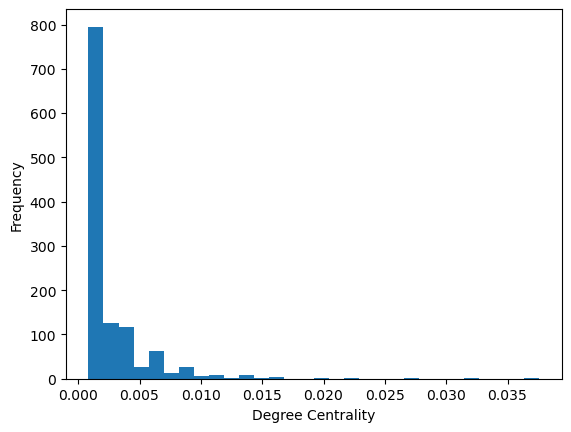

In [45]:
# calculating degree 
#by getting degree values to filter the weak nodes
degree_weak = nx.degree_centrality(Graph_net)

# Plot the degree centrality distribution
plt.hist(degree_weak.values(), bins=30)
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.show()

Number of communities found before filtering: 104
Modularity after removing weak nodes: 0.42969172525689564
Number of communities found after Removing weak nodes: 14


<Figure size 2000x1500 with 0 Axes>

Text(0.5, 1.0, 'communities found after filtering the weak nodes')

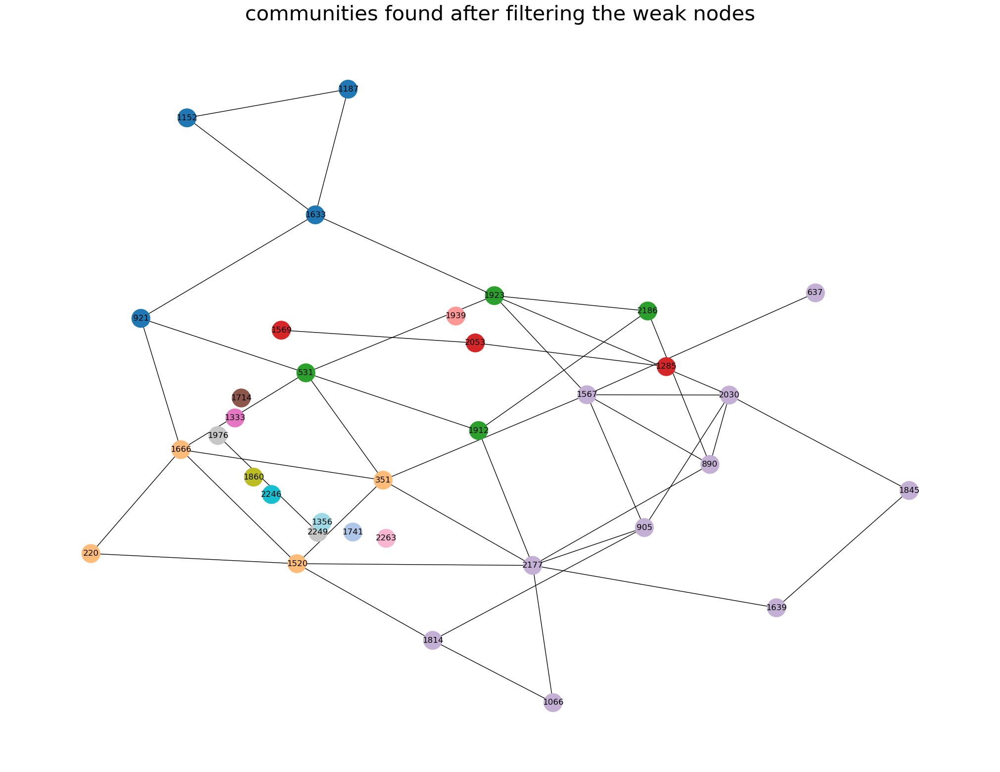

In [82]:
#using degree values choosed 0.01 for removing the weak nodes in the community

# Print the number of communities found before filtering the weak nodes from original communities
node_filtering = len(uniq_commu)
print(f"Number of communities found before filtering: {node_filtering}")

# Choose a maximum value for degree centrality
degree_max = 0.01  

# Compute degree centrality for each node
degree_node = nx.degree_centrality(Graph_net)

# remove or filter the weak nodes based on degree centrality maximum value
filter_nodes = [node for node, centrality in degree_node.items() if centrality >= degree_max]

# Create a subgraph after removing the weak nodes 
filter_sgraph = Graph_net.subgraph(filter_nodes)

# apply if condition to check  the subgraph is  empty or  not  before applying the Louvain algorithm
if filter_sgraph.number_of_nodes() > 0:
    # Apply the Louvain algorithm for community detection on the filtered graph
    weak_filtered = com.best_partition(filter_sgraph)
    
    # Convert the community partition to a dictionary to perform mouldarity
    plouvain_dict = dict(weak_filtered)
    
    # Calculate modularity 
    modularity_value = com.modularity(plouvain_dict, filter_sgraph)

    # Print the modularity value
    print(f"Modularity after removing weak nodes: {modularity_value}")

    # to get number of communities formed after removing the weak nodes
    uni_community = set(weak_filtered.values())
    # Print the number of communities 
    afternode_filtering = len(uni_community)
    print(f"Number of communities found after Removing weak nodes: {afternode_filtering}")

    # Choose a layout 
    layout_algo = nx.kamada_kawai_layout(filter_sgraph)

    # Use distinct color palettes for communities to identify the different communties in the graph
    if 'weak_filtered' in locals():
        color_palette = plt.cm.tab20  
        # get community colors
        colors = [weak_filtered[node] for node in filter_sgraph.nodes()]
    else:
        color_palette = 'red'  

    # Plot the subgraph with colour , node size, and labes 
    plt.figure(figsize=(20, 15)) 
    # draw the plot
    nx.draw(
        filter_sgraph,
        layout_algo,
        node_color=colors,
        with_labels=True,
        cmap=color_palette,
        node_size=700,
        alpha=1,  
    )
    plt.title("communities found after filtering the weak nodes", fontsize= 30)
    plt.savefig("/Users/nithyashree/Desktop/aaacommunityfilter.png", dpi=100)
    plt.show()
else:
    print("No communities found after filtering.")


Mean Degree of chameleon after filtering : 2.4571428571428573


(array([8., 0., 5., 0., 0., 7., 0., 0., 4., 0., 0., 3., 0., 0., 6., 0., 0.,
        1., 0., 1.]),
 array([0.  , 0.35, 0.7 , 1.05, 1.4 , 1.75, 2.1 , 2.45, 2.8 , 3.15, 3.5 ,
        3.85, 4.2 , 4.55, 4.9 , 5.25, 5.6 , 5.95, 6.3 , 6.65, 7.  ]),
 <BarContainer object of 20 artists>)

Text(0.5, 1.0, 'Degree Distributionchameleon dataset')

Text(0.5, 0, 'Degree')

Text(0, 0.5, 'Frequency')

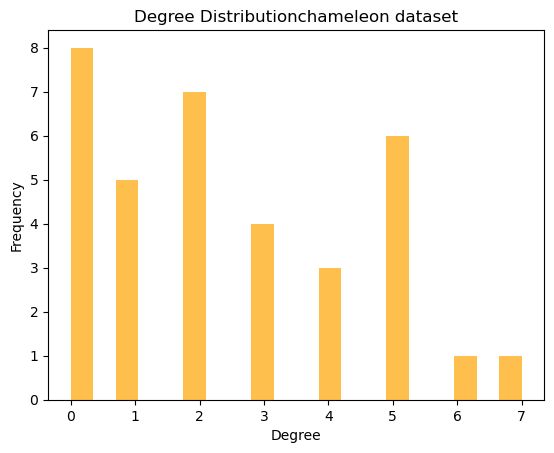

In [47]:
#calculate degree for filtered communities
G_degrees = dict(nx.degree(filter_sgraph))

# Mean Degree for filtered communities Graph
mean_graph = sum(G_degrees.values()) / len(G_degrees)

# Display Mean Degree for filtered communities Graph of chameleon dataset
print("Mean Degree of chameleon after filtering :", mean_graph)

#Histogram Plot for Wfiltered communities Graph of chameleon Degree Distribution
#hist keyword is used for plotting 
plt.hist(list(G_degrees.values()), bins=20, color='Orange', alpha=0.7)
#title for plot
plt.title("Degree Distributionchameleon dataset")
# label for x axis
plt.xlabel("Degree")
#label for y axis
plt.ylabel("Frequency")
plt.savefig("/Users/nithyashree/Desktop/meandegree.png", dpi=100)
plt.show() 


In [48]:
# Calculate degree centrality for each node
degree_center = nx.degree_centrality(filter_sgraph)
print("Degree Centrality:")
for node, centrality in degree_center.items():
    print(f"Node {node}: {centrality}")

# Calculate closeness centrality for each node
closeness_center = nx.closeness_centrality(filter_sgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_center.items():
    print(f"Node {node}: {centrality}")

# Calculate betweenness centrality for each node
betweenness_center = nx.betweenness_centrality(filter_sgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_center.items():
    print(f"Node {node}: {centrality}")


Degree Centrality:
Node 1152: 0.058823529411764705
Node 2177: 0.20588235294117646
Node 1666: 0.14705882352941177
Node 1923: 0.14705882352941177
Node 1285: 0.029411764705882353
Node 2053: 0.058823529411764705
Node 905: 0.11764705882352941
Node 2186: 0.08823529411764705
Node 1939: 0.0
Node 531: 0.14705882352941177
Node 1814: 0.08823529411764705
Node 921: 0.08823529411764705
Node 1567: 0.1764705882352941
Node 1569: 0.029411764705882353
Node 1187: 0.058823529411764705
Node 1066: 0.058823529411764705
Node 1714: 0.0
Node 1333: 0.0
Node 1845: 0.058823529411764705
Node 1976: 0.029411764705882353
Node 1860: 0.0
Node 2246: 0.0
Node 2249: 0.029411764705882353
Node 1356: 0.0
Node 1741: 0.0
Node 2263: 0.0
Node 220: 0.058823529411764705
Node 351: 0.14705882352941177
Node 1633: 0.11764705882352941
Node 1639: 0.058823529411764705
Node 2030: 0.14705882352941177
Node 1520: 0.14705882352941177
Node 1912: 0.08823529411764705
Node 890: 0.11764705882352941
Node 637: 0.029411764705882353

Closeness Centralit

In [49]:
density_filtered = nx.density(filter_sgraph)
print(f"Density : {density_filtered}")


Density : 0.07226890756302522


In [50]:
#Calculate clustering coefficient for the filtered subgraph for communities
clustering_ccommunity = nx.average_clustering(filter_sgraph)
print(f"Average Clustering Coefficient : {clustering_ccommunity}")


Average Clustering Coefficient : 0.16231292517006804


<BarContainer object of 3 artists>

Text(0.5, 1.0, 'Nodes with Maximum Centrality Measures')

Text(0, 0.5, 'Centrality Value')

Text(0, 7.05, '7.0000\nNode: 2177\n')

Text(1, 0.35164158686730507, '0.3016\nNode: 1567\n')

Text(2, 0.13817218877379306, '0.0882\nNode: 1923\n')

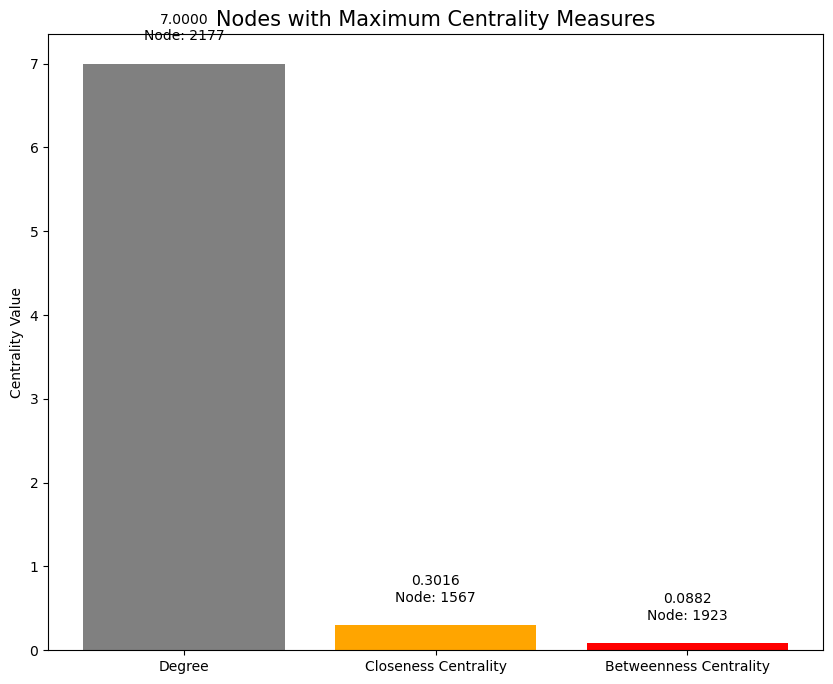

The node with the maximum degree is 2177 with a degree of 7
The node with the maximum closeness centrality is 1567 with a closeness centrality of 0.3016415868673051
The node with the maximum betweenness centrality is 1923 with a betweenness centrality of 0.08817218877379304


In [51]:
# Compute degree, closeness centrality, and betweenness centrality
degrees_gh = dict(filter_sgraph.degree())
closeness_gh = nx.closeness_centrality(filter_sgraph)  # Use filter_sgraph here
betweenness_gh = nx.betweenness_centrality(filter_sgraph)  # Use filter_sgraph here

# Compute maximum values and corresponding nodes
degreekey = max(degrees_gh, key=degrees_gh.get)
closenesskey = max(closeness_gh, key=closeness_gh.get)
betweennesskey = max(betweenness_gh, key=betweenness_gh.get)

maxi_degree = degrees_gh[degreekey]
maxi_closeness = closeness_gh[closenesskey]
maxi_betweenness = betweenness_gh[betweennesskey]

# Create a plot with axis
fig, ax = plt.subplots(figsize=(10, 8))  # Rename A1 to ax

# Plotting the values of degree, closeness centrality, betweenness centrality
ax.bar(['Degree', 'Closeness Centrality', 'Betweenness Centrality'], 
       [maxi_degree, maxi_closeness, maxi_betweenness], color=['grey', 'orange', 'red'])

# Set the title
ax.set_title('Nodes with Maximum Centrality Measures', fontsize= 15)
ax.set_ylabel('Centrality Value')

#label for nodes on the bar
for i, (max_value, key_list) in enumerate(zip([maxi_degree, maxi_closeness, maxi_betweenness],
                                              [degreekey, closenesskey, betweennesskey])):
    ax.text(i, max_value + 0.05, f'{max_value:.4f}\nNode: {key_list}\n', ha='center', va='bottom')
plt.savefig("/Users/nithyashree/Desktop/aacenter.png", dpi=100)
# Visualize the plot
plt.show()

# Display the maximum values
print("The node with the maximum degree is", degreekey, "with a degree of", maxi_degree)
print("The node with the maximum closeness centrality is", closenesskey, 
      "with a closeness centrality of", maxi_closeness)
print("The node with the maximum betweenness centrality is", betweennesskey, 
      "with a betweenness centrality of", maxi_betweenness)
